In [28]:
import warnings
warnings.filterwarnings('ignore')

import pymongo
from pymongo import MongoClient
client = MongoClient()

import numpy as np

import pandas as pd
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error, median_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.model_selection import TimeSeriesSplit 

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
plt.style.use('fivethirtyeight')
%matplotlib inline

import seaborn as sns
sns.set()

import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm

import scipy.stats as scs
from scipy.optimize import minimize

from dateutil.relativedelta import relativedelta
from itertools import product
from tqdm import tqdm_notebook

from fbprophet import Prophet

In [2]:
db = client.latest_data
collection = db.parents_skills
data = pd.DataFrame(list(collection.find())).dropna(subset=['No_of_trails', 'response_percentage'])

In [3]:
users = data.student_id.unique()

In [4]:
data = data[['student_id', 'targets_id','target_status_id', 'session_date','No_of_trails', 'response_percentage' ]]

In [5]:
data =  data.groupby(data['student_id'])

In [6]:
data.count()

,targets_id,target_status_id,session_date,No_of_trails,response_percentage
student_id,,,,,
92,157,157,157,157,157
94,221,221,221,221,221
96,42,42,42,42,42
97,72,72,72,72,72
99,5,5,5,5,5
100,153,153,153,153,153
103,237,237,237,237,237
104,308,308,308,308,308
108,12,12,12,12,12


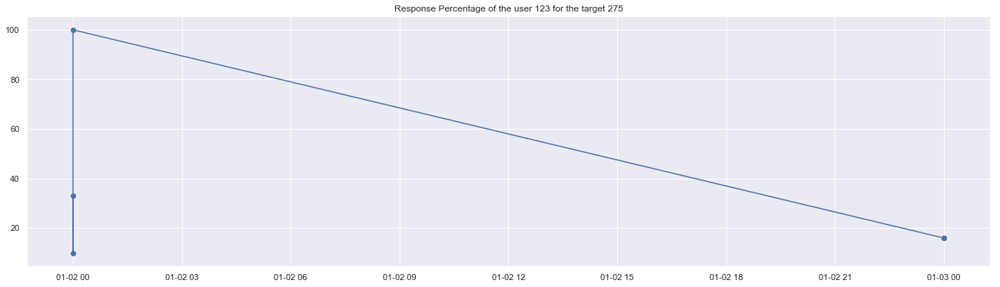

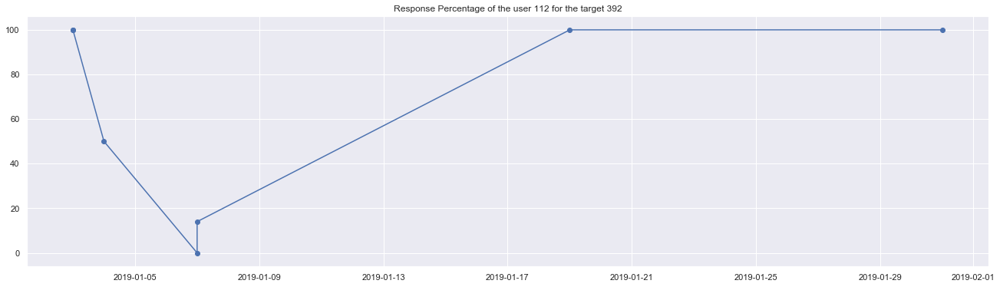

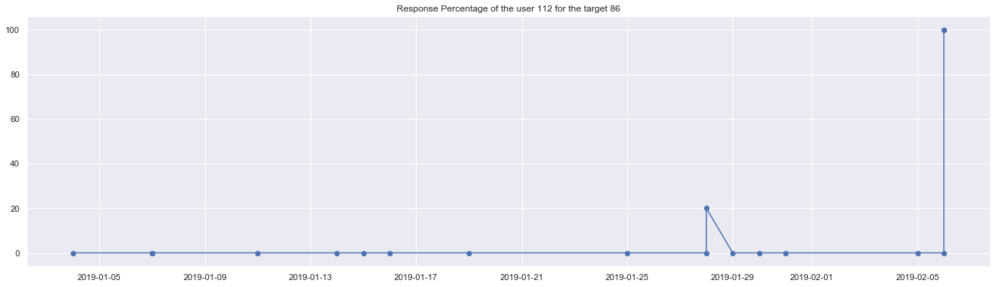

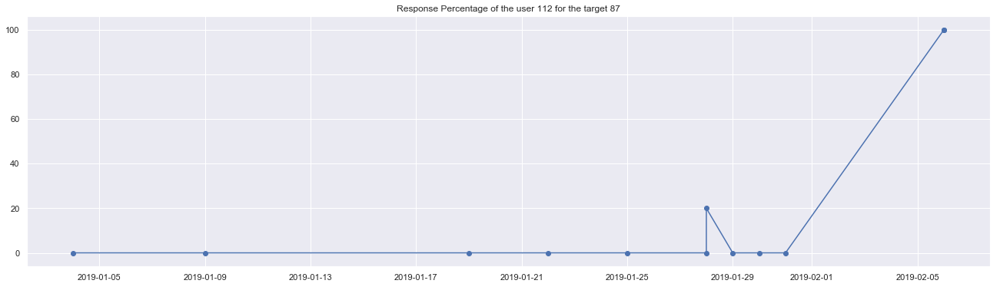

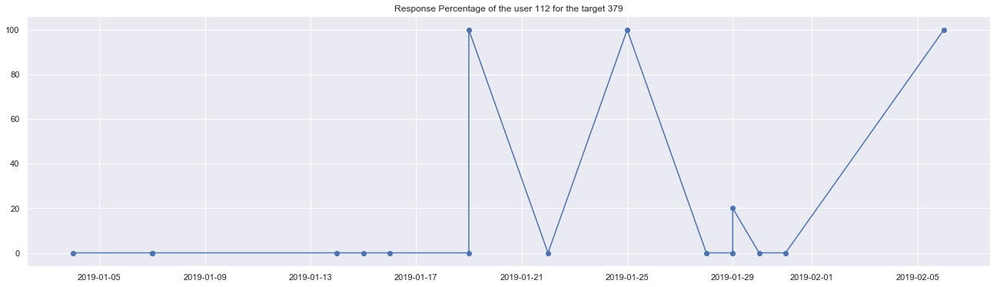

...

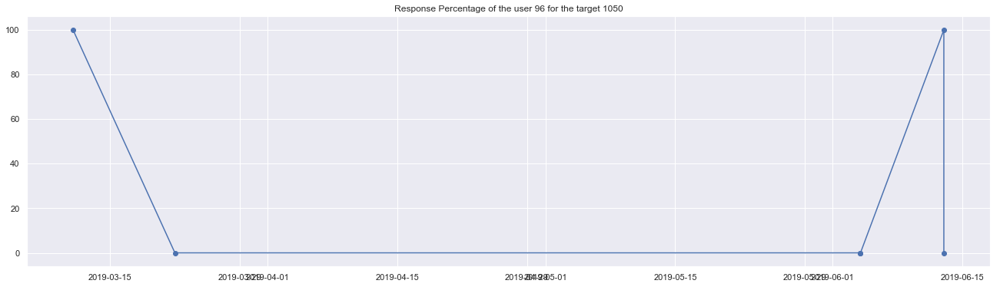

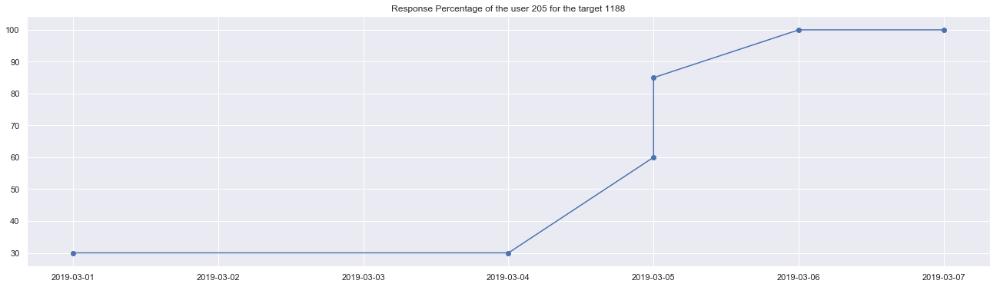

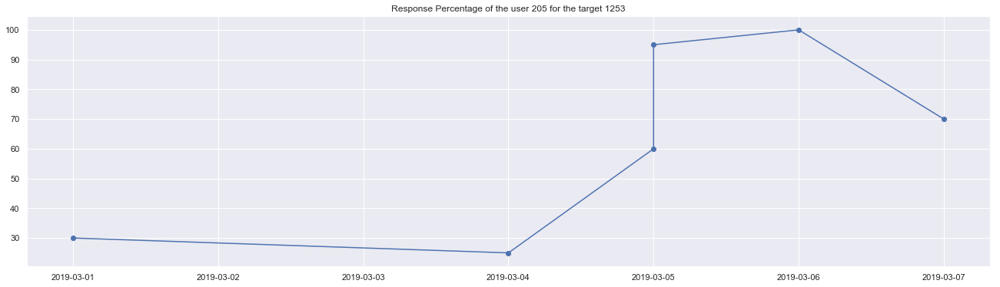

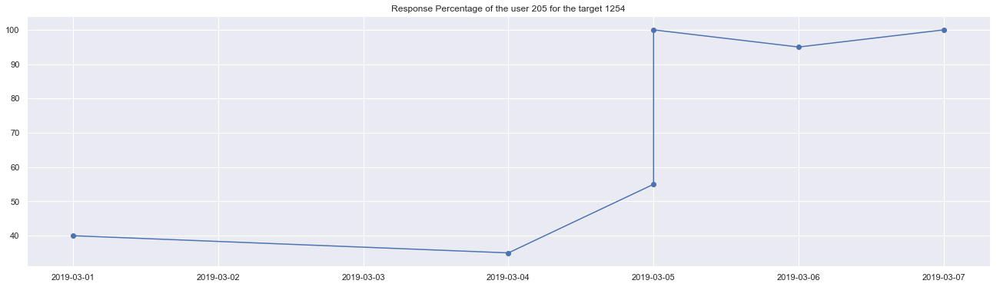

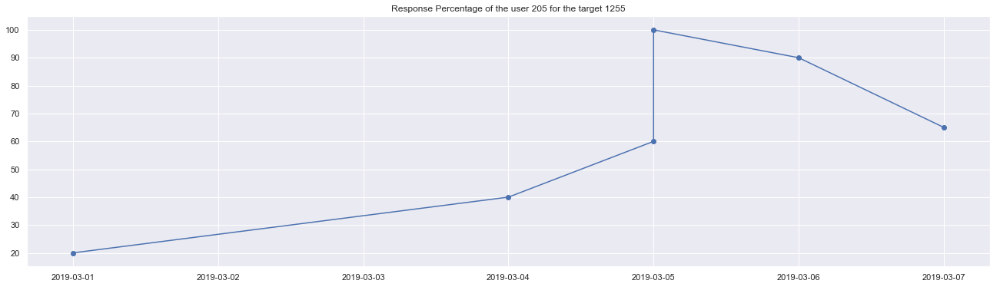

In [7]:
for user in users:
    data_user = data.get_group(user).iloc[:,1:]
    user_targets = data_user.targets_id.unique()
    data_user = data_user.groupby(data_user['targets_id'])
    for target in user_targets:
        data_user_target = data_user.get_group(target).iloc[:,1:].sort_values(by=['session_date']).set_index('session_date')
        if len(data_user_target.index) > 4:
            plt.figure(figsize=(20,6))
            plt.plot(data_user_target.index, data_user_target.response_percentage)
            plt.scatter(data_user_target.index, data_user_target.response_percentage)
            plt.title('Response Percentage of the user %d for the target %d' %(user, target))
            plt.grid(True)
            plt.show()

**Here we will try to find the correlation between the learning of a child across multiple domains**

1. *Normalized Cross-Correlation*

In [8]:
#ts refers to time series
def find_correlation(ts_1, ts_2):
    ts_1 = np.array(ts_1['response_percentage']) / 100
    ts_2 = np.array(ts_2['response_percentage']) / 100
    virtual_len = np.minimum(len(ts_1), len(ts_2))
    return np.sum(ts_1[:virtual_len] * ts_2[:virtual_len]) / np.sqrt( np.sum(ts_1[:virtual_len]**2) * np.sum(ts_2[:virtual_len]**2))

correlations = {}
for user in users:
    data_user = data.get_group(user).iloc[:,1:]
    user_targets = data_user.targets_id.unique()
    user_targets.sort()
    num_targets = len(user_targets)
    data_user = data_user.groupby(data_user['targets_id'])
    correlation = np.ones((num_targets,num_targets))
    for i,target in enumerate(user_targets):
        data_user_target = data_user.get_group(target).iloc[:,1:].sort_values(by=['session_date']).set_index('session_date')
        for j in range(i+1, num_targets):
            dummy = data_user.get_group(user_targets[j]).iloc[:,1:].sort_values(by=['session_date']).set_index('session_date')
            correlation[i][j] = round(find_correlation(data_user_target, dummy),1)
            correlation[j][i] = correlation[i][j]
    correlation = pd.DataFrame(correlation).set_index(user_targets)
    correlations[user] = correlation.rename(columns=dict(zip(list(correlation.columns.values), user_targets)))
        

In [9]:
#This shows how the learning of child 110 is correlated with other targts. Blue values shows high correlations.
correlations[110].style.applymap(lambda x: 'color: blue' if x >= 0.8 else 'color: black')

,356,421,422,423,424,425,426,427,428,429,528,529,530,531,740,752,813,814,815,816,830,1088,1135,1187,1190,1191,1194
356,1,0.4,0.7,0.9,0.7,1,1,0.8,0.6,0.9,0.4,0.8,0.9,0.7,1,0.7,0.6,0.6,0.7,1,0.8,0.8,0.5,nan,1,1,nan
421,0.4,1,0.6,0.4,0,nan,0.4,0.5,0,0.4,0,0.5,0.5,0,0.2,0.4,0.3,0,0.4,nan,nan,0.6,0.3,nan,nan,nan,nan
422,0.7,0.6,1,0.8,0.7,nan,0.6,0.9,0.3,0.5,0.7,0.9,0.5,0.6,0.5,0.6,0.4,0.7,0.3,0.5,0.7,1,0.2,nan,nan,nan,nan
423,0.9,0.4,0.8,1,0.6,0.8,0.9,0.9,0.6,0.8,0.4,0.9,0.8,0.7,0.9,0.7,0.3,0.6,0.8,0.8,0.6,0.8,0.6,nan,0.7,0.7,nan
424,0.7,0,0.7,0.6,1,1,0.6,0.6,0.6,0.4,0.7,0.8,0.7,0.5,0.5,0.8,0.8,0.4,0.4,0.6,0.8,0.8,0.2,nan,1,1,nan
425,1,nan,nan,0.8,1,1,1,0.6,0.8,1,nan,0.6,1,0.6,1,0.6,0.7,nan,0.7,1,0.8,0.8,0.6,nan,1,1,nan
426,1,0.4,0.6,0.9,0.6,1,1,0.8,0.6,0.9,0.7,0.9,0.9,0.6,1,0.6,0.7,0.5,0.7,1,0.8,0.8,0.5,nan,1,1,nan
427,0.8,0.5,0.9,0.9,0.6,0.6,0.8,1,0.4,0.7,0.5,1,0.6,0.8,0.8,0.8,0.3,0.7,0.8,0.7,0.5,0.8,0.6,nan,0.7,0.7,nan
428,0.6,0,0.3,0.6,0.6,0.8,0.6,0.4,1,0.6,0.6,0.6,0.8,0.7,0.5,0.4,0.6,0,0.7,0.7,0.2,0.4,0.7,nan,0.7,0.7,nan
429,0.9,0.4,0.5,0.8,0.4,1,0.9,0.7,0.6,1,0.4,0.7,1,0.6,0.9,0.4,0.6,0.4,0.7,1,0.6,0.7,0.6,nan,1,1,nan


**Here we will try and find the similar relationships when targerts are considered independent of child**

In [17]:
data = pd.DataFrame(list(collection.find())).dropna(subset=['No_of_trails', 'response_percentage'])

In [18]:
data = data[['targets_id','target_status_id', 'session_date','No_of_trails', 'response_percentage' ]]

In [19]:
targets = data.targets_id.unique()
targets.sort()

In [20]:
data =  data.groupby(data['targets_id'])

In [21]:
data.count()

,target_status_id,session_date,No_of_trails,response_percentage
targets_id,,,,
86,19,19,19,19
87,12,12,12,12
89,12,12,12,12
93,13,13,13,13
94,1,1,1,1
95,3,3,3,3
96,1,1,1,1
100,1,1,1,1
275,5,5,5,5


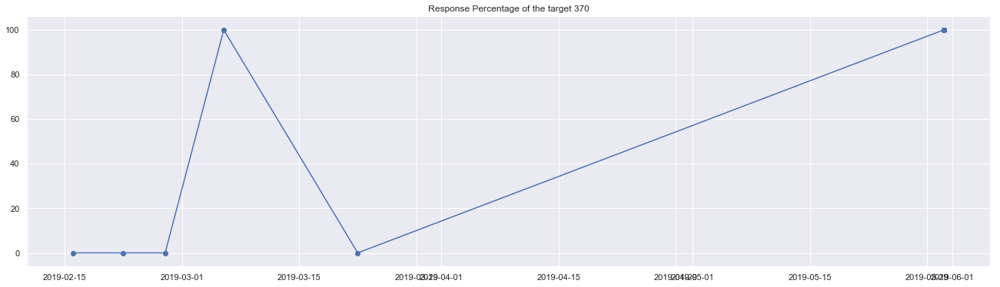

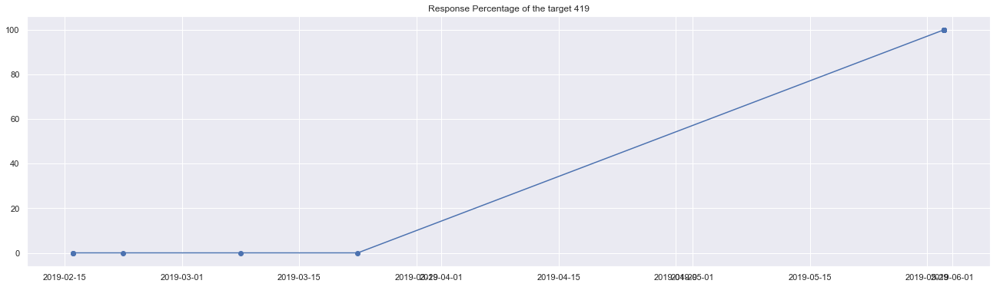

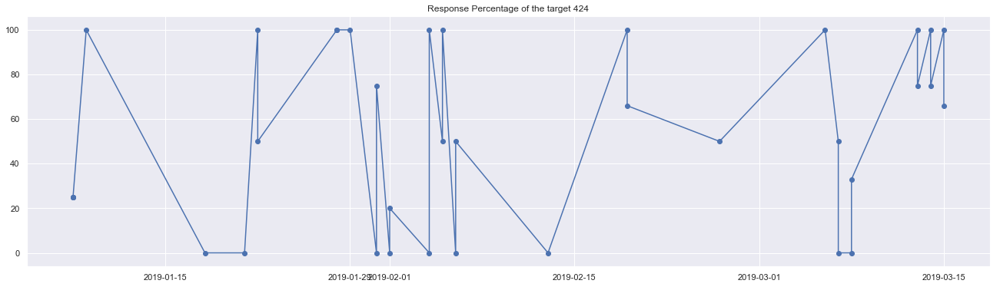

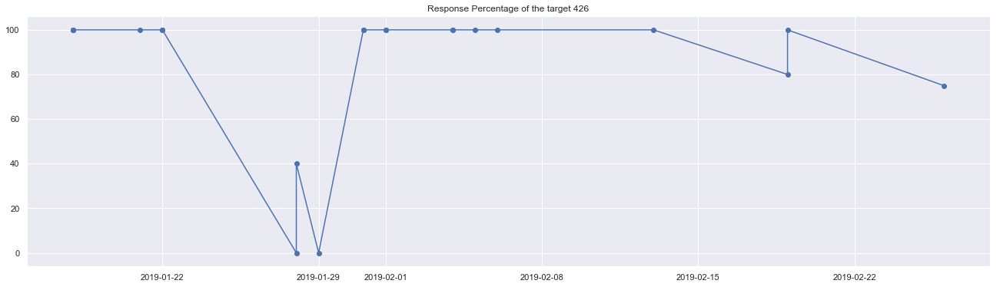

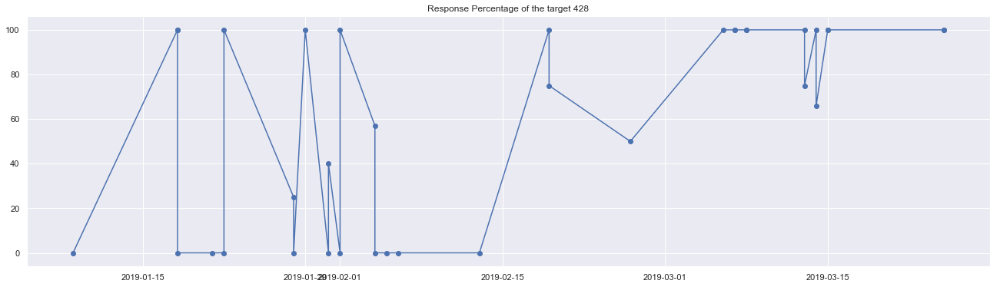

...

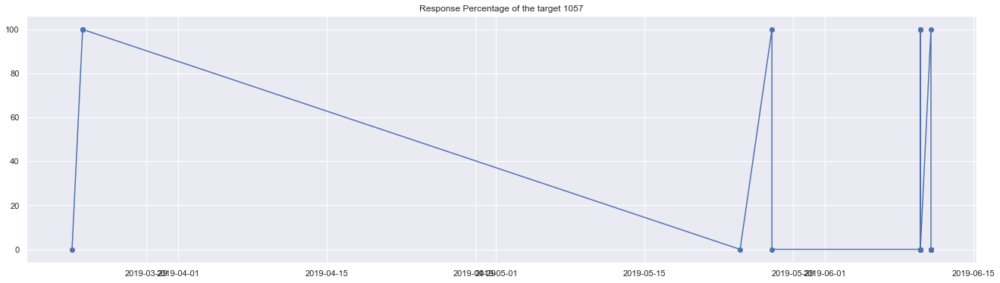

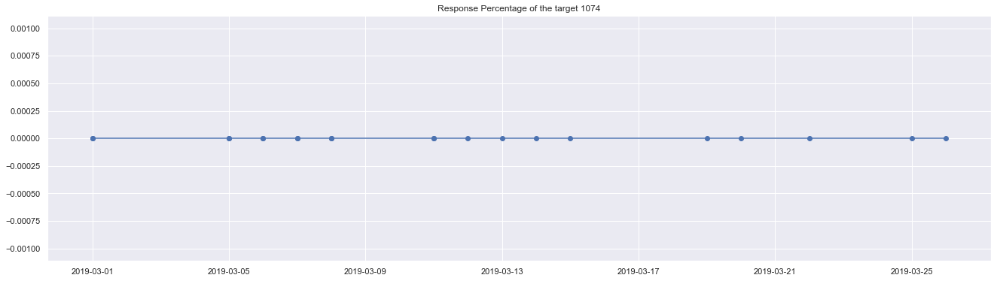

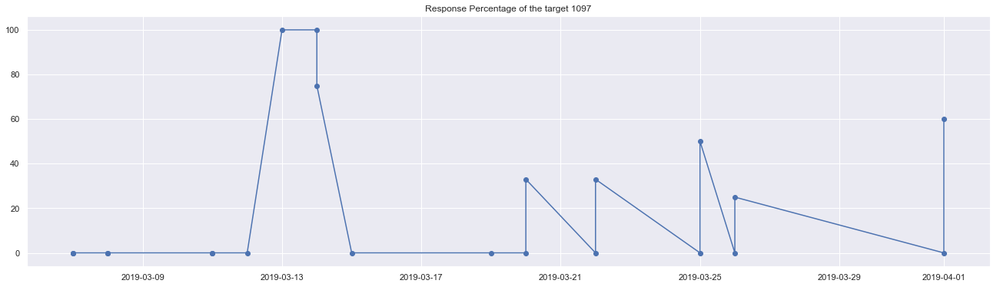

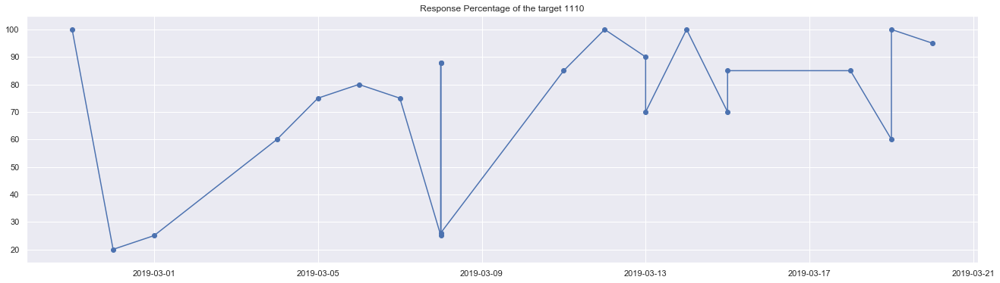

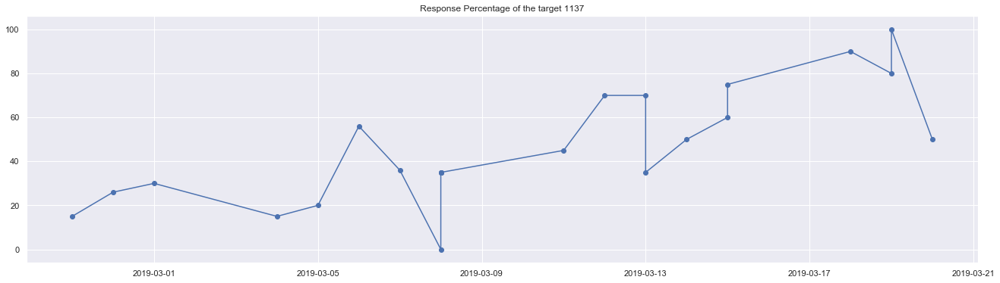

In [22]:
for target in targets:
    data_target = data.get_group(target).iloc[:,1:].sort_values(by=['session_date']).set_index('session_date')
    if len(data_target.index) > 20:
        plt.figure(figsize=(20,6))
        plt.plot(data_target.index, data_target.response_percentage)
        plt.scatter(data_target.index, data_target.response_percentage)
        plt.title('Response Percentage of the target %d' %(target))
        plt.grid(True)
        plt.show()

In [23]:
num_targets = targets.shape[0]
correlation = np.ones((num_targets, num_targets))
for i,target in enumerate(targets):
    data_target = data.get_group(target).iloc[:,1:]
    for j in range(i+1, num_targets):
        dummy = data.get_group(targets[j]).iloc[:,1:].sort_values(by=['session_date']).set_index('session_date')
        correlation[i][j] = round(find_correlation(data_target, dummy),1)
        correlation[j][i] = correlation[i][j]


In [24]:
correlation = pd.DataFrame(correlation).set_index(targets)
correlation = correlation.rename(columns=dict(zip(list(correlation.columns.values), targets)))

In [29]:
correlation

,86,87,89,93,94,95,96,100,275,276,329,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,368,369,370,371,372,373,375,376,377,378,379,381,384,389,391,392,393,394,395,396,397,419,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,438,440,441,442,443,444,447,448,451,452,455,456,457,461,463,467,468,471,473,474,476,477,480,482,483,488,490,491,492,493,494,495,497,498,499,500,501,504,506,508,509,510,511,512,513,514,515,516,517,518,522,523,525,526,527,528,529,530,531,532,533,534,535,536,537,540,541,542,543,544,545,546,547,549,556,559,566,567,568,569,570,571,572,573,574,583,584,586,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,612,613,614,629,630,631,632,635,636,637,638,642,643,644,645,648,651,655,657,660,661,670,671,679,691,692,693,694,740,746,747,748,749,750,752,755,762,764,767,771,775,777,780,782,784,785,786,787,788,789,790,791,805,806,807,812,813,814,815,816,818,830,832,833,834,868,873,875,876,877,878,879,880,881,883,884,885,886,887,888,892,894,895,896,897,898,899,900,901,902,903,904,905,907,909,912,913,914,915,916,917,918,919,920,921,922,923,934,935,936,937,938,964,966,967,968,969,970,974,975,976,980,981,983,989,990,991,993,994,996,997,1000,1001,1002,1003,1004,1005,1006,1007,1011,1014,1015,1016,1019,1022,1024,1026,1027,1032,1033,1044,1045,1046,1047,1048,1050,1053,1054,1055,1056,1057,1058,1060,1069,1071,1074,1077,1078,1079,1080,1081,1083,1084,1088,1091,1092,1093,1094,1097,1099,1100,1101,1102,1103,1104,1105,1108,1109,1110,1111,1112,1113,1114,1115,1116,1117,1118,1119,1120,1121,1122,1123,1130,1134,1135,1136,1137,1138,1141,1142,1143,1144,1145,1146,1147,1148,1149,1150,1151,1152,1153,1155,1156,1157,1158,1186,1187,1188,1189,1190,1191,1194,1195,1196,1197,1236,1238,1240,1241,1242,1244,1253,1254,1255,1258,1259,1267,1268,1269,1270,1272,1284,1297,1299,1300,1301,1302,1303,1304,1305,1306,1307,1310,1312,1313,1314,1315,1316,1317,1381,1383,1385
86,1.0,0.7,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3,NaN,NaN,NaN,NaN,0.3,NaN,NaN,NaN,NaN,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,0.4,NaN,NaN,NaN,0.4,NaN,0.4,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.4,0.4,NaN,NaN,0.0,0.2,NaN,0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.1,0.0,0.2,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.4,0.0,0.3,NaN,NaN,NaN,0.3,0.2,0.3,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.5,0.4,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3,NaN,NaN,0.3,0.4,NaN,NaN,NaN,NaN,NaN,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3,0.0,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.6,0.4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1,NaN,NaN,0.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3,NaN,NaN,0.3,NaN,NaN,NaN,NaN,0.2,0.4,NaN,0.4,NaN,0.1,0.3,NaN,0.2,NaN,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
87,0.7,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.5,0.3,0.4,0.4,0.3,0.4,0.4,0.4,0.5,0.4,0.0,0.5,0.4,0.4,NaN,NaN,NaN,NaN,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,0.1,0.5,0.0,0.1,0.0,NaN,NaN,0.6,NaN,0.5,NaN,0.4,NaN,0.5,NaN,0.2,0.2,NaN,NaN,NaN,0.0,NaN,NaN,0.0,0.1,1.0,NaN,NaN,0.2,0.3,NaN,0.6,NaN